In [0]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
from pyspark.sql import SparkSession
#Create session
spark = SparkSession.builder.appName("IPL Data Analysis").getOrCreate()

In [0]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, BooleanType, DateType
from pyspark.sql.functions import col

# Define schema using StructType and StructField
ball_by_ball_schema = StructType([
    StructField("match_id", IntegerType(), True),
    StructField("over_id", IntegerType(), True),
    StructField("ball_id", IntegerType(), True),
    StructField("innings_no", IntegerType(), True),
    StructField("team_batting", StringType(), True),
    StructField("team_bowling", StringType(), True),
    StructField("striker_batting_position", IntegerType(), True),
    StructField("extra_type", StringType(), True),
    StructField("runs_scored", IntegerType(), True),
    StructField("extra_runs", IntegerType(), True),
    StructField("wides", IntegerType(), True),  
    StructField("legbyes", IntegerType(), True),  
    StructField("byes", IntegerType(), True), 
    StructField("noballs", IntegerType(), True),  
    StructField("penalty", IntegerType(), True),
    StructField("bowler_extras", IntegerType(), True),
    StructField("out_type", StringType(), True),
    StructField("caught", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for caught out
    StructField("bowled", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for bowled out
    StructField("run_out", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for run-out
    StructField("lbw", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for LBW
    StructField("retired_hurt", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for retired hurt
    StructField("stumped", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for stumped
    StructField("caught_and_bowled", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for caught & bowled
    StructField("hit_wicket", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for hit wicket
    StructField("obstructingfeild", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for obstructing field
    StructField("bowler_wicket", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for bowler taking the wicket
    StructField("match_date", StringType(), True), # importing it as stringtype but need to convert it into DateType 
    StructField("season", StringType(), True),
    StructField("striker", StringType(), True),
    StructField("non_striker", StringType(), True),
    StructField("bowler", StringType(), True),
    StructField("player_out", StringType(), True),
    StructField("fielders", StringType(), True),
    StructField("striker_match_sk", IntegerType(), True),
    StructField("strikersk", IntegerType(), True),
    StructField("nonstriker_match_sk", IntegerType(), True),
    StructField("nonstriker_sk", IntegerType(), True),
    StructField("fielder_match_sk", IntegerType(), True),
    StructField("fielder_sk", IntegerType(), True),
    StructField("bowler_match_sk", IntegerType(), True),
    StructField("bowler_sk", IntegerType(), True),
    StructField("playerout_match_sk", IntegerType(), True),
    StructField("battingteam_sk", IntegerType(), True),
    StructField("bowlingteam_sk", IntegerType(), True),
    StructField("keeper_catch", StringType(), True),  # importing it as stringtype but need to convert it into Boolean for keeper taking a catch if needed
    StructField("player_out_sk", IntegerType(), True),
    StructField("matchdatesk", IntegerType(), True)
])

# Load the CSV file with the defined schema
ball_by_ball_df = spark.read.format("csv").schema(ball_by_ball_schema).option("header", "true").load("dbfs:/FileStore/tables/Ball_By_Ball.csv")

# Convert the StringType columns to BooleanType
ball_by_ball_df = ball_by_ball_df.withColumn("caught", col("caught").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("bowled", col("bowled").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("run_out", col("run_out").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("lbw", col("lbw").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("retired_hurt", col("retired_hurt").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("stumped", col("stumped").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("caught_and_bowled", col("caught_and_bowled").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("hit_wicket", col("hit_wicket").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("obstructingfeild", col("obstructingfeild").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("bowler_wicket", col("bowler_wicket").cast(BooleanType()))
ball_by_ball_df = ball_by_ball_df.withColumn("keeper_catch", col("keeper_catch").cast(BooleanType()))

# Show the DataFrame
ball_by_ball_df.display()

match_id,over_id,ball_id,innings_no,team_batting,team_bowling,striker_batting_position,extra_type,runs_scored,extra_runs,wides,legbyes,byes,noballs,penalty,bowler_extras,out_type,caught,bowled,run_out,lbw,retired_hurt,stumped,caught_and_bowled,hit_wicket,obstructingfeild,bowler_wicket,match_date,season,striker,non_striker,bowler,player_out,fielders,striker_match_sk,strikersk,nonstriker_match_sk,nonstriker_sk,fielder_match_sk,fielder_sk,bowler_match_sk,bowler_sk,playerout_match_sk,battingteam_sk,bowlingteam_sk,keeper_catch,player_out_sk,matchdatesk
598028,15,6,1,5,2,6,No Extras,4,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,277,104,83,null,null,20336,276,20333,103,-1,-1,20343,82,-1,4,1,false,0,20130420
598028,14,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,false,0,20130420
598028,14,2,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,false,0,20130420
598028,14,3,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,false,0,20130420
598028,14,4,1,5,2,3,No Extras,0,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,false,0,20130420
598028,14,5,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,false,0,20130420
598028,14,6,1,5,2,3,No Extras,2,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,false,0,20130420
598028,13,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,104,6,83,null,null,20333,103,20328,5,-1,-1,20343,82,-1,4,1,false,0,20130420
598028,13,2,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,false,0,20130420
598028,13,3,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,4/20/2013,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,false,0,20130420


In [0]:
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, BooleanType, DateType
from pyspark.sql.functions import to_date

# Define schema using StructType and StructField
match_schema = StructType([
    StructField("match_sk", IntegerType(), True),                # Surrogate key for the match
    StructField("match_id", IntegerType(), True),                # Unique match identifier
    StructField("team1", StringType(), True),                    # Name of team 1
    StructField("team2", StringType(), True),                    # Name of team 2
    StructField("match_date", StringType(),False),                 # Match date
    StructField("season_year", IntegerType(), True),             # Year of the season
    StructField("venue_name", StringType(), True),               # Name of the venue
    StructField("city_name", StringType(), True),                # City where match is played
    StructField("country_name", StringType(), True),             # Country where match is played
    StructField("toss_winner", StringType(), True),              # Team that won the toss
    StructField("match_winner", StringType(), True),             # Team that won the match
    StructField("toss_name", StringType(), True),                # Choice made by toss winner (bat/bowl)
    StructField("win_type", StringType(), True),                 # Type of win (e.g., runs, wickets)
    StructField("outcome_type", StringType(), True),             # Outcome type (result, no result, tie)
    StructField("manofmach", StringType(), True),                # Player of the match
    StructField("win_margin", IntegerType(), True),              # Win margin (runs or wickets)
    StructField("country_id", IntegerType(), True),              # Country ID (foreign key)
])

# Load the CSV file with the defined schema
match_df = spark.read.format("csv").schema(match_schema).option("header", "true").load("dbfs:/FileStore/tables/Match.csv")

# Show the DataFrame
match_df.display()



match_sk,match_id,team1,team2,match_date,season_year,venue_name,city_name,country_name,toss_winner,match_winner,toss_name,win_type,outcome_type,manofmach,win_margin,country_id
0,335987,Royal Challengers Bangalore,Kolkata Knight Riders,4/18/2008,2008,M Chinnaswamy Stadium,Bangalore,India,Royal Challengers Bangalore,Kolkata Knight Riders,field,runs,Result,BB McCullum,140,1
1,335988,Kings XI Punjab,Chennai Super Kings,4/19/2008,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Chennai Super Kings,Chennai Super Kings,bat,runs,Result,MEK Hussey,33,1
2,335989,Delhi Daredevils,Rajasthan Royals,4/19/2008,2008,Feroz Shah Kotla,Delhi,India,Rajasthan Royals,Delhi Daredevils,bat,wickets,Result,MF Maharoof,9,1
3,335990,Mumbai Indians,Royal Challengers Bangalore,4/20/2008,2008,Wankhede Stadium,Mumbai,India,Mumbai Indians,Royal Challengers Bangalore,bat,wickets,Result,MV Boucher,5,1
4,335991,Kolkata Knight Riders,Deccan Chargers,4/20/2008,2008,Eden Gardens,Kolkata,India,Deccan Chargers,Kolkata Knight Riders,bat,wickets,Result,DJ Hussey,5,1
5,335992,Rajasthan Royals,Kings XI Punjab,4/21/2008,2008,Sawai Mansingh Stadium,Jaipur,India,Kings XI Punjab,Rajasthan Royals,bat,wickets,Result,SR Watson,6,1
6,335993,Deccan Chargers,Delhi Daredevils,4/22/2008,2008,"Rajiv Gandhi International Stadium, Uppal",Hyderabad,India,Deccan Chargers,Delhi Daredevils,bat,wickets,Result,V Sehwag,9,1
7,335994,Chennai Super Kings,Mumbai Indians,4/23/2008,2008,"MA Chidambaram Stadium, Chepauk",Chennai,India,Mumbai Indians,Chennai Super Kings,field,runs,Result,ML Hayden,6,1
8,335995,Deccan Chargers,Rajasthan Royals,4/24/2008,2008,"Rajiv Gandhi International Stadium, Uppal",Hyderabad,India,Rajasthan Royals,Rajasthan Royals,field,wickets,Result,YK Pathan,3,1
9,335996,Kings XI Punjab,Mumbai Indians,4/25/2008,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Mumbai Indians,Kings XI Punjab,field,runs,Result,KC Sangakkara,66,1


In [0]:
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, DateType, BooleanType

# Define schema using StructType and StructField
player_schema = StructType([
    StructField("player_sk", IntegerType(), True),            # Surrogate key for the player
    StructField("player_id", IntegerType(), True),            # Unique player identifier
    StructField("player_name", StringType(), True),           # Name of the player
    StructField("dob", StringType(), True),                     # Date of birth (DateType)
    StructField("batting_hand", StringType(), True),          # Batting hand (left/right)
    StructField("bowling_skill", StringType(), True),         # Bowling skill (e.g., fast, spin)
    StructField("country_name", StringType(), True)           # Name of the player's country
])

# Load the CSV file with the defined schema
player_df = spark.read.format("csv").schema(player_schema).option("header", "true").load("dbfs:/FileStore/tables/Player.csv")

# Show the DataFrame
player_df.display()


player_sk,player_id,player_name,dob,batting_hand,bowling_skill,country_name
0,1,SC Ganguly,7/8/1972,Left-hand bat,Right-arm medium,India
1,2,BB McCullum,9/27/1981,Right-hand bat,Right-arm medium,New Zealand
2,3,RT Ponting,12/19/1974,Right-hand bat,Right-arm medium,Australia
3,4,DJ Hussey,7/15/1977,Right-hand bat,Right-arm offbreak,Australia
4,5,Mohammad Hafeez,10/17/1980,Right-hand bat,Right-arm offbreak,Pakistan
5,6,R Dravid,1/11/1973,Right-hand bat,Right-arm offbreak,India
6,7,W Jaffer,2/16/1978,Right-hand bat,Right-arm offbreak,India
7,8,V Kohli,11/5/1988,Right-hand bat,Right-arm medium,India
8,9,JH Kallis,10/16/1975,Right-hand bat,Right-arm fast-medium,South Africa
9,10,CL White,8/18/1983,Right-hand bat,Legbreak googly,Australia


In [0]:
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, DateType, BooleanType

team_schema = StructType([
    StructField("Team_SK",IntegerType(),False),
    StructField("Team_Id",IntegerType(),False),
    StructField("Team_Name",StringType(),False)
])

team_df = spark.read.format("csv").schema(team_schema).option('header',"True").load("dbfs:/FileStore/tables/Team.csv")

team_df.display()

Team_SK,Team_Id,Team_Name
0,1,Kolkata Knight Riders
1,2,Royal Challengers Bangalore
2,3,Chennai Super Kings
3,4,Kings XI Punjab
4,5,Rajasthan Royals
5,6,Delhi Daredevils
6,7,Mumbai Indians
7,8,Deccan Chargers
8,9,Kochi Tuskers Kerala
9,10,Pune Warriors


In [0]:
ball_by_ball_df = spark.read.format("csv").option("header","true").option("inferSchema","true").load('dbfs:/FileStore/tables/Player_match.csv')

In [0]:
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, DateType, BooleanType, LongType

# Define schema using StructType and StructField
player_match_schema = StructType([
    StructField("player_match_sk", IntegerType(), True),         # Surrogate key for player-match
    StructField("playermatch_key", StringType(), True),         # Unique key for player-match
    StructField("match_id", IntegerType(), True),                # Unique match identifier
    StructField("player_id", IntegerType(), True),               # Unique player identifier
    StructField("player_name", StringType(), True),              # Player's name
    StructField("dob", StringType(), True),                        # Player's date of birth (DateType)
    StructField("batting_hand", StringType(), True),             # Player's batting hand (left/right)
    StructField("bowling_skill", StringType(), True),            # Player's bowling skill (fast/spin)
    StructField("country_name", StringType(), True),             # Country of the player
    StructField("role_desc", StringType(), True),                # Player's role description (batsman/bowler)
    StructField("player_team", StringType(), True),              # Team the player belongs to
    StructField("opposit_team", StringType(), True),             # Opposite team name
    StructField("season_year", IntegerType(), True),             # Year of the season
    StructField("is_manofthematch", StringType(), True),        # Boolean flag for man of the match ***************
    StructField("age_as_on_match", IntegerType(), True),         # Player's age at the time of the match
    StructField("isplayers_team_won", StringType(), True),      # Boolean flag for whether the player's team won ************
    StructField("batting_status", StringType(), True),           # Batting status (e.g., out, not out)
    StructField("bowling_status", StringType(), True),           # Bowling status (e.g., bowled, did not bowl)
    StructField("player_captain", StringType(), True),       
    StructField("opposit_captain", StringType(), True),         
    StructField("player_keeper", StringType(), True),          
    StructField("opposit_keeper", StringType(), True)           
])

# Load the CSV file with the defined schema
player_match_df = spark.read.format("csv").schema(player_match_schema).option("header", "true").load("dbfs:/FileStore/tables/Player_match.csv")

# Get the first row (to be deleted)
first_row = player_match_df.limit(1)

# Remove the first row by subtracting it from the DataFrame
player_match_df = player_match_df.subtract(first_row)

# Converting stringtype to boolean
player_match_df = player_match_df.withColumn("is_manofthematch", col("is_manofthematch").cast(BooleanType()))
player_match_df = player_match_df.withColumn("isplayers_team_won", col("isplayers_team_won").cast(BooleanType()))

# Show the DataFrame
player_match_df.display()


player_match_sk,playermatch_key,match_id,player_id,player_name,dob,batting_hand,bowling_skill,country_name,role_desc,player_team,opposit_team,season_year,is_manofthematch,age_as_on_match,isplayers_team_won,batting_status,bowling_status,player_captain,opposit_captain,player_keeper,opposit_keeper
13049,33600300086,336003,86,Shoaib Malik,2/1/1982,Right-hand bat,Right-arm offbreak,Pakistan,Player,Delhi Daredevils,Royal Challengers Bangalore,2008,false,26,true,null,null,V Sehwag,R Dravid,KD Karthik,MV Boucher
13136,33600700057,336007,57,RG Sharma,4/30/1987,Right-hand bat,Right-arm offbreak,India,Player,Deccan Chargers,Royal Challengers Bangalore,2008,false,21,false,null,null,AC Gilchrist,R Dravid,AC Gilchrist,SP Goswami
13167,33600800001,336008,1,SC Ganguly,7/8/1972,Left-hand bat,Right-arm medium,India,Captain,Kolkata Knight Riders,Kings XI Punjab,2008,false,36,false,null,null,SC Ganguly,Yuvraj Singh,WP Saha,KC Sangakkara
13188,33600900118,336009,118,GD McGrath,2/9/1970,Right-hand bat,Right-arm fast-medium,Australia,Player,Delhi Daredevils,Mumbai Indians,2008,false,38,false,null,null,V Sehwag,SM Pollock,KD Karthik,YV Takawale
13256,33601200020,336012,20,MS Dhoni,7/7/1981,Right-hand bat,Right-arm medium,India,CaptainKeeper,Chennai Super Kings,Deccan Chargers,2008,false,27,false,null,null,MS Dhoni,AC Gilchrist,MS Dhoni,AC Gilchrist
13278,33601300045,336013,45,DJ Thornely,10/1/1978,Right-hand bat,Right-arm medium,Australia,Player,Mumbai Indians,Rajasthan Royals,2008,false,30,true,null,null,SM Pollock,SK Warne,YV Takawale,M Rawat
13352,33601600126,336016,126,MM Patel,7/12/1983,Right-hand bat,Right-arm medium-fast,India,Player,Rajasthan Royals,Deccan Chargers,2008,false,25,true,null,null,SK Warne,AC Gilchrist,M Rawat,AC Gilchrist
13817,33603900055,336039,55,VVS Laxman,11/1/1974,Right-hand bat,Right-arm offbreak,India,Captain,Deccan Chargers,Royal Challengers Bangalore,2008,false,34,false,null,null,VVS Laxman,R Dravid,AC Gilchrist,MV Boucher
13940,33604400023,336044,23,S Badrinath,8/30/1980,Right-hand bat,Right-arm offbreak,India,Player,Chennai Super Kings,Kings XI Punjab,2008,false,28,true,null,null,MS Dhoni,Yuvraj Singh,PA Patel,KC Sangakkara
14043,39218900112,392189,112,DB Ravi Teja,9/5/1987,Right-hand bat,Legbreak googly,India,Player,Deccan Chargers,Kolkata Knight Riders,2009,false,22,true,null,null,AC Gilchrist,BB McCullum,AC Gilchrist,BB McCullum


In [0]:
dbutils.fs.ls("/FileStore/tables/")

Out[25]: [FileInfo(path='dbfs:/FileStore/tables/Ball_By_Ball-1.csv', name='Ball_By_Ball-1.csv', size=25099132, modificationTime=1725873365000),
 FileInfo(path='dbfs:/FileStore/tables/Ball_By_Ball-2.csv', name='Ball_By_Ball-2.csv', size=25099132, modificationTime=1725873530000),
 FileInfo(path='dbfs:/FileStore/tables/Ball_By_Ball-3.csv', name='Ball_By_Ball-3.csv', size=25099132, modificationTime=1725873783000),
 FileInfo(path='dbfs:/FileStore/tables/Ball_By_Ball-4.csv', name='Ball_By_Ball-4.csv', size=25099132, modificationTime=1725873897000),
 FileInfo(path='dbfs:/FileStore/tables/Ball_By_Ball.csv', name='Ball_By_Ball.csv', size=25099132, modificationTime=1725873272000),
 FileInfo(path='dbfs:/FileStore/tables/Match-1.csv', name='Match-1.csv', size=113358, modificationTime=1725873515000),
 FileInfo(path='dbfs:/FileStore/tables/Match-2.csv', name='Match-2.csv', size=113358, modificationTime=1725873756000),
 FileInfo(path='dbfs:/FileStore/tables/Match-3.csv', name='Match-3.csv', size=1133

In [0]:
# Check for non-numeric values in the 'runs_scored' column
ball_by_ball_df.filter(~col("runs_scored").cast("int").isNotNull()).select("runs_scored").distinct().display()

runs_scored


In [0]:
from pyspark.sql.functions import *
# Conditional Column: Flag for high impact balls (either a wicket or more than 6 runs including extras)
ball_by_ball_df = ball_by_ball_df.withColumn(
    "high_impact",
    when((col("runs_scored") + col("extra_runs") > 6) | (col("bowler_wicket") == True), True).otherwise(False)
)

# Display the rows where "high_impact" is True along with the "over_id"
ball_by_ball_df.filter(col("high_impact") == True).groupBy("over_id").agg(
    count("*").alias("high_impact_count")
).select("over_id", "high_impact_count").orderBy("high_impact_count").display()

over_id,high_impact_count
7,239
8,244
1,247
2,276
9,278
10,278
4,285
12,286
13,290
3,299


In [0]:
from pyspark.sql.functions import year, month, dayofmonth, when

# Extracting year, month, and day from the match date for more detailed time-based analysis
match_df = match_df.withColumn("year", year("match_date"))
match_df = match_df.withColumn("month", month("match_date"))
match_df = match_df.withColumn("day", dayofmonth("match_date"))

# High margin win: categorizing win margins into 'high', 'medium', and 'low'
match_df = match_df.withColumn(
    "win_margin_category",
    when(col("win_margin") >= 100, "High")
    .when((col("win_margin") >= 50) & (col("win_margin") < 100), "Medium")
    .otherwise("Low")
)

# Analyze the impact of the toss: who wins the toss and the match
match_df = match_df.withColumn(
    "toss_match_winner",
    when(col("toss_winner") == col("match_winner"), "Yes").otherwise("No")
)

# Show the enhanced match DataFrame
match_df.limit(5).display(2)

match_sk,match_id,team1,team2,match_date,season_year,venue_name,city_name,country_name,toss_winner,match_winner,toss_name,win_type,outcome_type,manofmach,win_margin,country_id,year,month,day,win_margin_category,toss_match_winner
0,335987,Royal Challengers Bangalore,Kolkata Knight Riders,4/18/2008,2008,M Chinnaswamy Stadium,Bangalore,India,Royal Challengers Bangalore,Kolkata Knight Riders,field,runs,Result,BB McCullum,140,1,null,null,null,High,No
1,335988,Kings XI Punjab,Chennai Super Kings,4/19/2008,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Chennai Super Kings,Chennai Super Kings,bat,runs,Result,MEK Hussey,33,1,null,null,null,Low,Yes
2,335989,Delhi Daredevils,Rajasthan Royals,4/19/2008,2008,Feroz Shah Kotla,Delhi,India,Rajasthan Royals,Delhi Daredevils,bat,wickets,Result,MF Maharoof,9,1,null,null,null,Low,No
3,335990,Mumbai Indians,Royal Challengers Bangalore,4/20/2008,2008,Wankhede Stadium,Mumbai,India,Mumbai Indians,Royal Challengers Bangalore,bat,wickets,Result,MV Boucher,5,1,null,null,null,Low,No
4,335991,Kolkata Knight Riders,Deccan Chargers,4/20/2008,2008,Eden Gardens,Kolkata,India,Deccan Chargers,Kolkata Knight Riders,bat,wickets,Result,DJ Hussey,5,1,null,null,null,Low,No


In [0]:
from pyspark.sql.functions import lower, regexp_replace

# Normalize and clean player names
player_df = player_df.withColumn("player_name", lower(regexp_replace("player_name", "[^a-zA-Z0-9 ]", "")))

# Handle missing values in 'batting_hand' and 'bowling_skill' with a default 'unknown'
player_df = player_df.na.fill({"batting_hand": "unknown", "bowling_skill": "unknown"})

# Categorizing players based on batting hand
player_df = player_df.withColumn(
    "batting_style",
    when(col("batting_hand").contains("left"), "Left-Handed").otherwise("Right-Handed")
)

# Show the modified player DataFrame
player_df.limit(5).display()

player_sk,player_id,player_name,dob,batting_hand,bowling_skill,country_name,batting_style
0,1,sc ganguly,7/8/1972,Left-hand bat,Right-arm medium,India,Right-Handed
1,2,bb mccullum,9/27/1981,Right-hand bat,Right-arm medium,New Zealand,Right-Handed
2,3,rt ponting,12/19/1974,Right-hand bat,Right-arm medium,Australia,Right-Handed
3,4,dj hussey,7/15/1977,Right-hand bat,Right-arm offbreak,Australia,Right-Handed
4,5,mohammad hafeez,10/17/1980,Right-hand bat,Right-arm offbreak,Pakistan,Right-Handed


In [0]:
from pyspark.sql.functions import col, when, current_date, expr

# Add a 'veteran_status' column based on player age
player_match_df = player_match_df.withColumn(
    "veteran_status",
    when(col("age_as_on_match") >= 35, "Veteran").otherwise("Non-Veteran")
)

# Dynamic column to calculate years since debut
player_match_df = player_match_df.withColumn(
    "years_since_debut",
    (year(current_date()) - col("season_year"))
)

# Show the enriched DataFrame
player_match_df.limit(5).display()


player_match_sk,playermatch_key,match_id,player_id,player_name,dob,batting_hand,bowling_skill,country_name,role_desc,player_team,opposit_team,season_year,is_manofthematch,age_as_on_match,isplayers_team_won,batting_status,bowling_status,player_captain,opposit_captain,player_keeper,opposit_keeper,veteran_status,years_since_debut
12697,33598700009,335987,9,JH Kallis,10/16/1975,Right-hand bat,Right-arm fast-medium,South Africa,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,false,33,false,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,16
12696,33598700008,335987,8,V Kohli,11/5/1988,Right-hand bat,Right-arm medium,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,false,20,false,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,16
12698,33598700010,335987,10,CL White,8/18/1983,Right-hand bat,Legbreak googly,Australia,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,false,25,false,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,16
12694,33598700006,335987,6,R Dravid,1/11/1973,Right-hand bat,Right-arm offbreak,India,Captain,Royal Challengers Bangalore,Kolkata Knight Riders,2008,false,35,false,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Veteran,16
12695,33598700007,335987,7,W Jaffer,2/16/1978,Right-hand bat,Right-arm offbreak,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,false,30,false,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,16


In [0]:
ball_by_ball_df.createOrReplaceTempView("ball_by_ball")
match_df.createOrReplaceTempView("match")
player_df.createOrReplaceTempView("player")
player_match_df.createOrReplaceTempView("player_match")
team_df.createOrReplaceTempView("team")

ball_by_ball_df.columns

Out[72]: ['match_id',
 'over_id',
 'ball_id',
 'innings_no',
 'team_batting',
 'team_bowling',
 'striker_batting_position',
 'extra_type',
 'runs_scored',
 'extra_runs',
 'wides',
 'legbyes',
 'byes',
 'noballs',
 'penalty',
 'bowler_extras',
 'out_type',
 'caught',
 'bowled',
 'run_out',
 'lbw',
 'retired_hurt',
 'stumped',
 'caught_and_bowled',
 'hit_wicket',
 'obstructingfeild',
 'bowler_wicket',
 'match_date',
 'season',
 'striker',
 'non_striker',
 'bowler',
 'player_out',
 'fielders',
 'striker_match_sk',
 'strikersk',
 'nonstriker_match_sk',
 'nonstriker_sk',
 'fielder_match_sk',
 'fielder_sk',
 'bowler_match_sk',
 'bowler_sk',
 'playerout_match_sk',
 'battingteam_sk',
 'bowlingteam_sk',
 'keeper_catch',
 'player_out_sk',
 'matchdatesk',
 'high_impact']

In [0]:
top_scoring_batsmen_per_season = spark.sql("""
SELECT 
p.player_name,
m.season_year,
SUM(b.runs_scored) AS total_runs 
FROM ball_by_ball b
JOIN match m ON b.match_id = m.match_id   
JOIN player_match pm ON m.match_id = pm.match_id AND b.striker = pm.player_id     
JOIN player p ON p.player_id = pm.player_id
GROUP BY p.player_name, m.season_year
ORDER BY m.season_year, total_runs DESC
""")

top_scoring_batsmen_per_season.display()

     

player_name,season_year,total_runs
se marsh,2008,616
g gambhir,2008,534
st jayasuriya,2008,514
sr watson,2008,468
gc smith,2008,441
ac gilchrist,2008,436
yk pathan,2008,435
sk raina,2008,421
ms dhoni,2008,414
v sehwag,2008,406


In [0]:
economical_bowlers_powerplay = spark.sql("""
SELECT 
p.player_name, 
AVG(b.runs_scored) AS avg_runs_per_ball, 
COUNT(b.bowler_wicket) AS total_wickets
FROM ball_by_ball b
JOIN player_match pm ON b.match_id = pm.match_id AND b.bowler = pm.player_id
JOIN player p ON pm.player_id = p.player_id
WHERE b.over_id <= 6
GROUP BY p.player_name
HAVING COUNT(*) >= 1
ORDER BY avg_runs_per_ball, total_wickets DESC
""")
economical_bowlers_powerplay.display()


player_name,avg_runs_per_ball,total_wickets
sm harwood,0.3157894736842105,19
a zampa,0.42857142857142855,7
avesh khan,0.5,12
ankit soni,0.5,6
gr napier,0.5,6
aj finch,0.5,6
nb singh,0.56,25
ag murtaza,0.6455696202531646,79
fh edwards,0.6585365853658537,82
sb bangar,0.6666666666666666,18


In [0]:
average_runs_in_wins = spark.sql("""
SELECT p.player_name, AVG(b.runs_scored) AS avg_runs_in_wins, COUNT(*) AS innings_played
FROM ball_by_ball b
JOIN player_match pm ON b.match_id = pm.match_id AND b.striker = pm.player_id
JOIN player p ON pm.player_id = p.player_id
JOIN match m ON pm.match_id = m.match_id
WHERE m.match_winner = pm.player_team
GROUP BY p.player_name
ORDER BY avg_runs_in_wins ASC
""")
average_runs_in_wins.display()


player_name,avg_runs_in_wins,innings_played
smsm senanayake,0.0,1
kp appanna,0.0,1
jj bumrah,0.0,3
i sharma,0.0,1
ts mills,0.0,3
a nehra,0.0,2
j theron,0.0,2
vr aaron,0.0,5
sn thakur,0.0,2
anirudh singh,0.0,1


In [0]:
import matplotlib.pyplot as plt


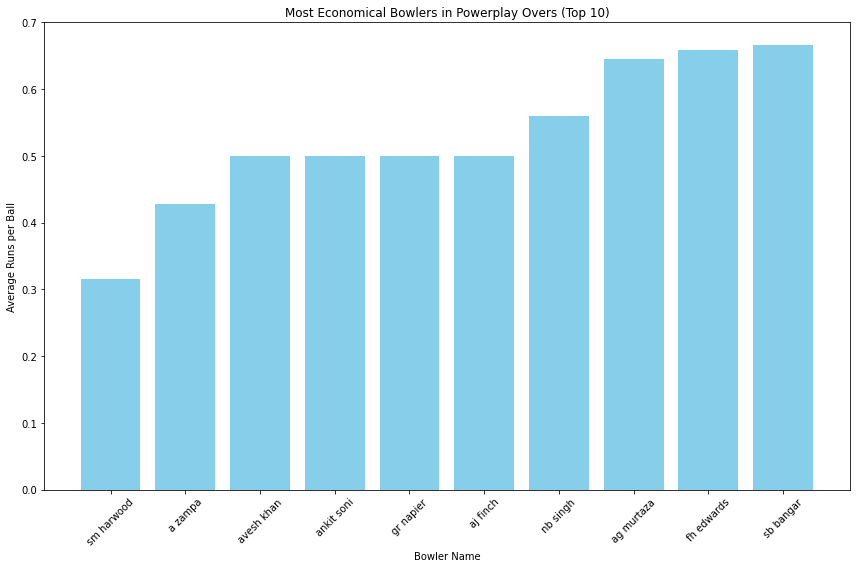

In [0]:

# Assuming 'economical_bowlers_powerplay' is already executed and available as a Spark DataFrame
economical_bowlers_pd = economical_bowlers_powerplay.toPandas()

# Visualizing using Matplotlib
plt.figure(figsize=(12, 8))
# Limiting to top 10 for clarity in the plot
top_economical_bowlers = economical_bowlers_pd.nsmallest(10, 'avg_runs_per_ball')
plt.bar(top_economical_bowlers['player_name'], top_economical_bowlers['avg_runs_per_ball'], color='skyblue')
plt.xlabel('Bowler Name')
plt.ylabel('Average Runs per Ball')
plt.title('Most Economical Bowlers in Powerplay Overs (Top 10)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [0]:
import seaborn as sns

In [0]:
match_df.printSchema()

root
 |-- match_sk: integer (nullable = true)
 |-- match_id: integer (nullable = true)
 |-- team1: string (nullable = true)
 |-- team2: string (nullable = true)
 |-- match_date: string (nullable = true)
 |-- season_year: integer (nullable = true)
 |-- venue_name: string (nullable = true)
 |-- city_name: string (nullable = true)
 |-- country_name: string (nullable = true)
 |-- toss_winner: string (nullable = true)
 |-- match_winner: string (nullable = true)
 |-- toss_name: string (nullable = true)
 |-- win_type: string (nullable = true)
 |-- outcome_type: string (nullable = true)
 |-- manofmach: string (nullable = true)
 |-- win_margin: integer (nullable = true)
 |-- country_id: integer (nullable = true)
 |-- year: integer (nullable = true)
 |-- month: integer (nullable = true)
 |-- day: integer (nullable = true)
 |-- win_margin_category: string (nullable = false)
 |-- toss_match_winner: string (nullable = false)



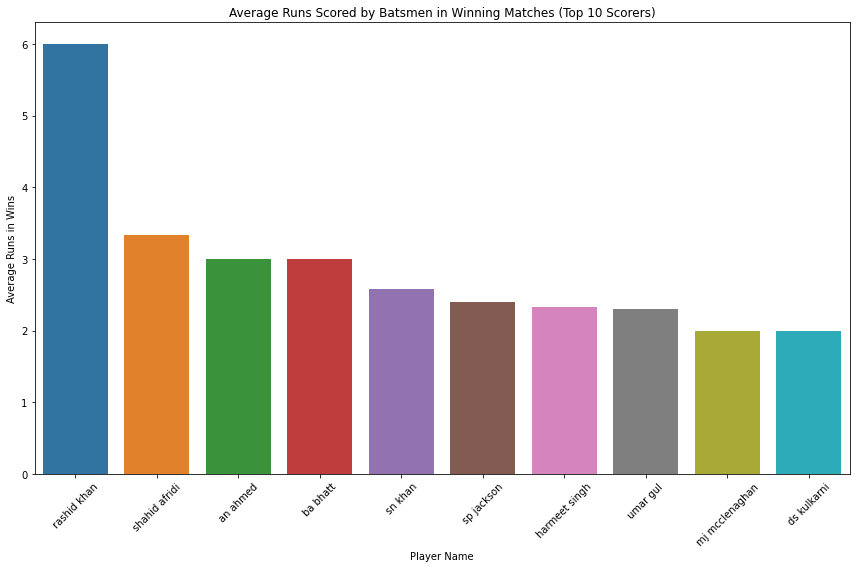

In [0]:
average_runs_pd = average_runs_in_wins.toPandas()

# Using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))
top_scorers = average_runs_pd.nlargest(10, 'avg_runs_in_wins')
sns.barplot(x='player_name', y='avg_runs_in_wins', data=top_scorers)
plt.title('Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [0]:
# Execute SQL Query
scores_by_venue = spark.sql("""
SELECT venue_name, AVG(total_runs) AS average_score, MAX(total_runs) AS highest_score
FROM (
    SELECT ball_by_ball.match_id, match.venue_name, SUM(runs_scored) AS total_runs
    FROM ball_by_ball
    JOIN match ON ball_by_ball.match_id = match.match_id
    GROUP BY ball_by_ball.match_id, match.venue_name
)
GROUP BY venue_name
ORDER BY average_score DESC
""")

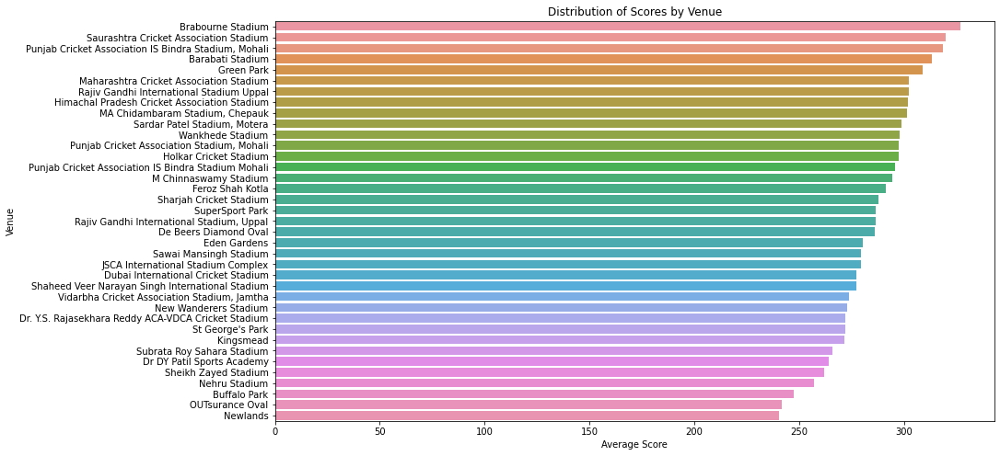

In [0]:
# Convert to Pandas DataFrame
scores_by_venue_pd = scores_by_venue.toPandas()

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='average_score', y='venue_name', data=scores_by_venue_pd)
plt.title('Distribution of Scores by Venue')
plt.xlabel('Average Score')
plt.ylabel('Venue')
plt.show()

In [0]:
# Execute SQL Query
dismissal_types = spark.sql("""
SELECT out_type, COUNT(*) AS frequency
FROM ball_by_ball
WHERE out_type IS NOT NULL
GROUP BY out_type
ORDER BY frequency DESC
""")

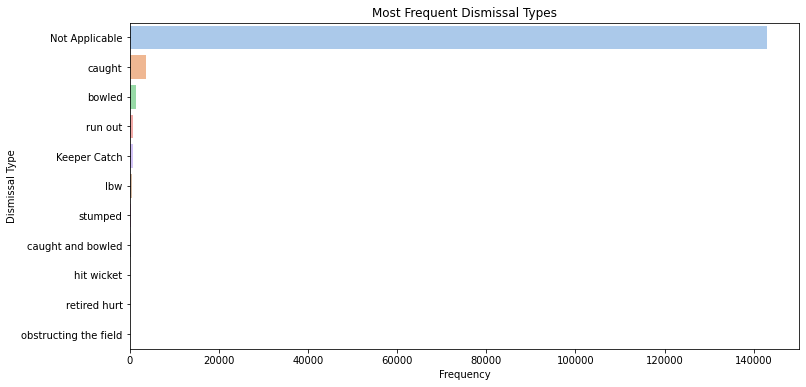

In [0]:
# Convert to Pandas DataFrame
dismissal_types_pd = dismissal_types.toPandas()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x='frequency', y='out_type', data=dismissal_types_pd, palette='pastel')
plt.title('Most Frequent Dismissal Types')
plt.xlabel('Frequency')
plt.ylabel('Dismissal Type')
plt.show()
     

In [0]:
# Execute SQL Query
team_toss_win_performance = spark.sql("""
SELECT team1, COUNT(*) AS matches_played, SUM(CASE WHEN toss_winner = match_winner THEN 1 ELSE 0 END) AS wins_after_toss
FROM match
WHERE toss_winner = team1
GROUP BY team1
ORDER BY wins_after_toss DESC
""")

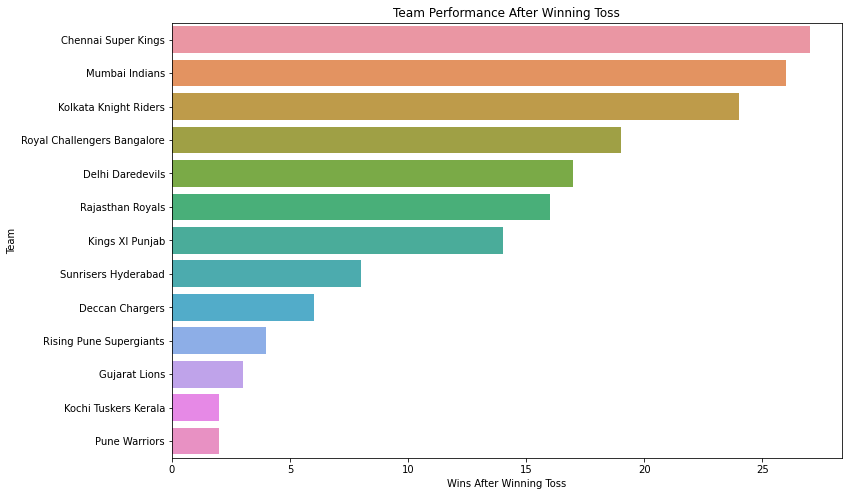

In [0]:
# Convert to Pandas DataFrame
team_toss_win_pd = team_toss_win_performance.toPandas()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='wins_after_toss', y='team1', data=team_toss_win_pd)
plt.title('Team Performance After Winning Toss')
plt.xlabel('Wins After Winning Toss')
plt.ylabel('Team')
plt.show()